In [1]:
from utils import *
import os
np.random.seed(42)

In [2]:
# Path to subjects' data
subjects_path = "subjects"
n_subjects = len(os.listdir(subjects_path)) -1  # Get the number of subjects
print(f'There are {n_subjects} subjects.')
files = [f for f in os.listdir('subjects') if os.path.isfile(os.path.join('subjects', f))]
print(files) #there is one extra file in the directory....

There are 27 subjects.
['.DS_Store']


In [3]:
# Initialize data storage
# all_datasets = []
# all_labels = []
# subject_ids = []
combined = pd.DataFrame(np.nan, index=range(27*120), columns=['ID', 'Label'] + list(range(0, 70)))

# Define feature functions
feature_functions = [mav, std, maxav, rms, wl, ssc, mf]

# Path to subjects' data
subjects_path = "subjects"
n_subjects = len(os.listdir(subjects_path)) -1  # Get the number of subjects

# Loop through each subject
for subject_idx in range(n_subjects):
    print(f"Processing Subject {subject_idx + 1}/{n_subjects}...")

    # Load subject data
    subject_file = f"{subjects_path}/s{subject_idx + 1}/S{subject_idx + 1}_A1_E1.mat"
    data = loadmat(subject_file)
    
    # Extract data
    emg = data["emg"]
    emg_rectified = np.abs(emg)  # Rectify EMG signals
    stimulus = data["restimulus"].flatten()
    repetition = data["rerepetition"].flatten()

    # Step 1: Pre-process EMG to calculate envelopes
    emg_envelopes = emg_envelope(emg_rectified, stimulus, repetition)

    # Step 2: Calculate average activations
    emg_average_activations = compute_emg_average_activations(emg_envelopes)

    # Step 3: Identify trials to exclude
    exclude_list = trial_to_exclude_all(emg_envelopes)

    # Step 4: Build the dataset for the subject
    dataset, labels = build_dataset_from_ninapro(
        emg_envelopes,
        features=feature_functions,
        exclude_list=exclude_list
    )

    combined.iloc[subject_idx*120:(subject_idx*120+dataset.shape[0]), 0] = np.ones_like(labels)*(subject_idx+1)
    combined.iloc[subject_idx*120:(subject_idx*120+dataset.shape[0]), 1] = labels
    combined.iloc[subject_idx*120:(subject_idx*120+dataset.shape[0]), 2:] = dataset

    # Store the dataset and labels
    # all_datasets.append(dataset)
    # all_labels.append(labels)
    # subject_ids.extend([subject_idx + 1] * len(labels))  # Add the subject ID for each row

combined = combined.dropna(how='all')

# # Combine datasets and labels if desired
# combined_dataset = np.vstack(all_datasets)
# combined_labels = np.hstack(all_labels)
# final_subject_ids = np.array(subject_ids)

# print("Data processing completed for all subjects.")
# # Check the shapes
# print(f"Dataset shape: {combined_dataset.shape}")
# print(f"Labels shape: {combined_labels.shape}")
# print(f"Subject IDs shape: {final_subject_ids.shape}")

# Check the shapes
print(f"Dataset shape: {combined.shape}")
print(f"Features shape: {combined.iloc[:,2:].shape}")
print(f"Labels shape: {combined.iloc[:,1].shape}")
print(f"Subject IDs shape: {combined.iloc[:,0].shape}")

Processing Subject 1/27...
all values in the window are identical for channel 6
all values in the window are identical for channel 6
all values in the window are identical for channel 6
all values in the window are identical for channel 6
Trials to exclude for Stimulus 1: [5, 8, 9, 10]
all values in the window are identical for channel 6
all values in the window are identical for channel 4
all values in the window are identical for channel 6
all values in the window are identical for channel 6
all values in the window are identical for channel 6
Trials to exclude for Stimulus 2: [2, 3, 4, 9, 10]
all values in the window are identical for channel 6
all values in the window are identical for channel 6
all values in the window are identical for channel 2
all values in the window are identical for channel 6
Trials to exclude for Stimulus 3: [3, 6, 8, 9]
Trials to exclude for Stimulus 4: []
Trials to exclude for Stimulus 5: []
Trials to exclude for Stimulus 6: []
Trials to exclude for Stimu

### Question 2
features - Are there any similarity/discrepancies between the subjects?

/Users/charl/Documents/EPFL/NX-421 NSSP/NSSP2/utils.py:430: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


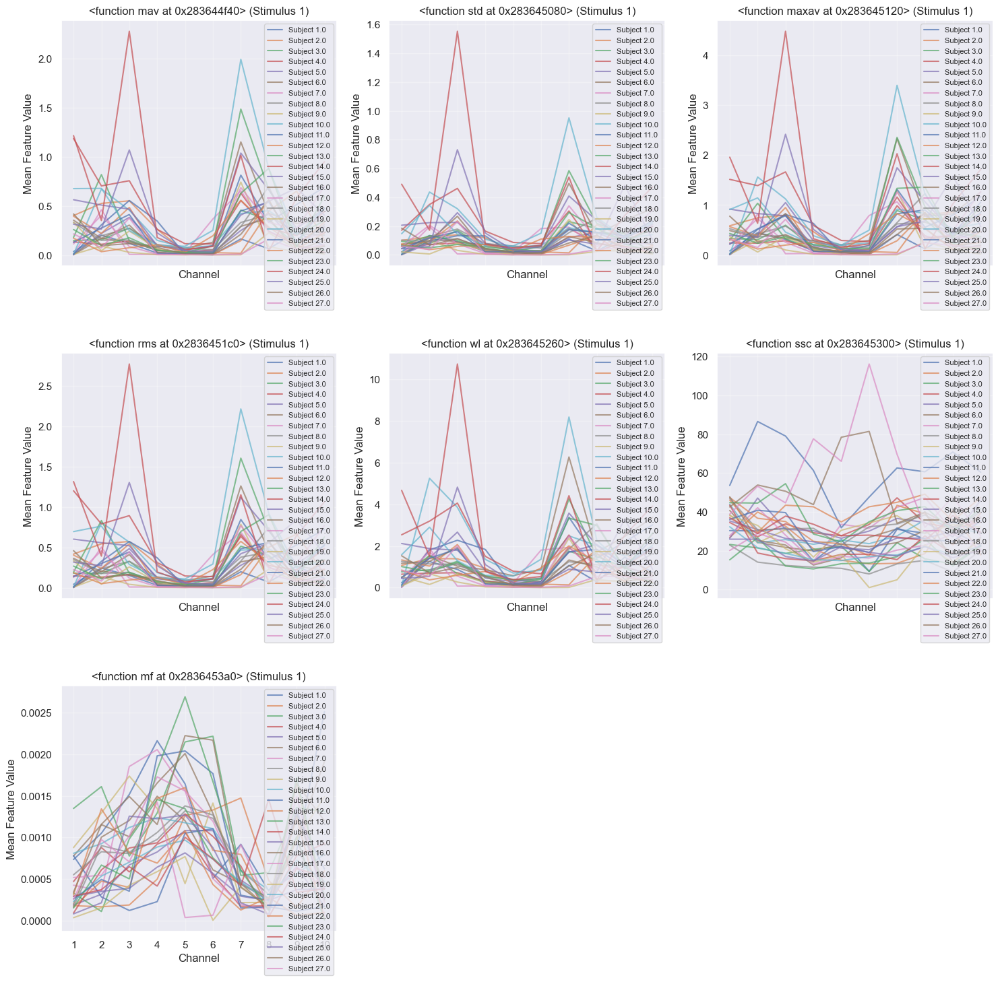

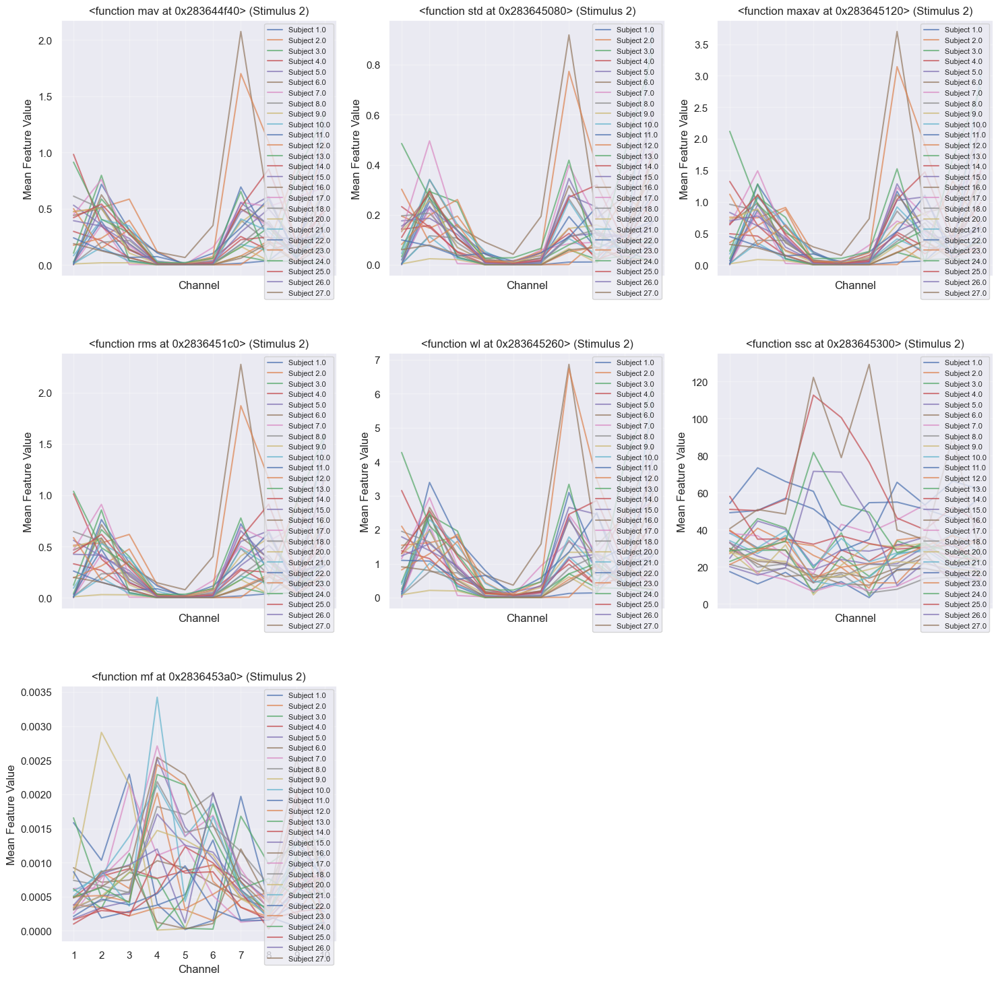

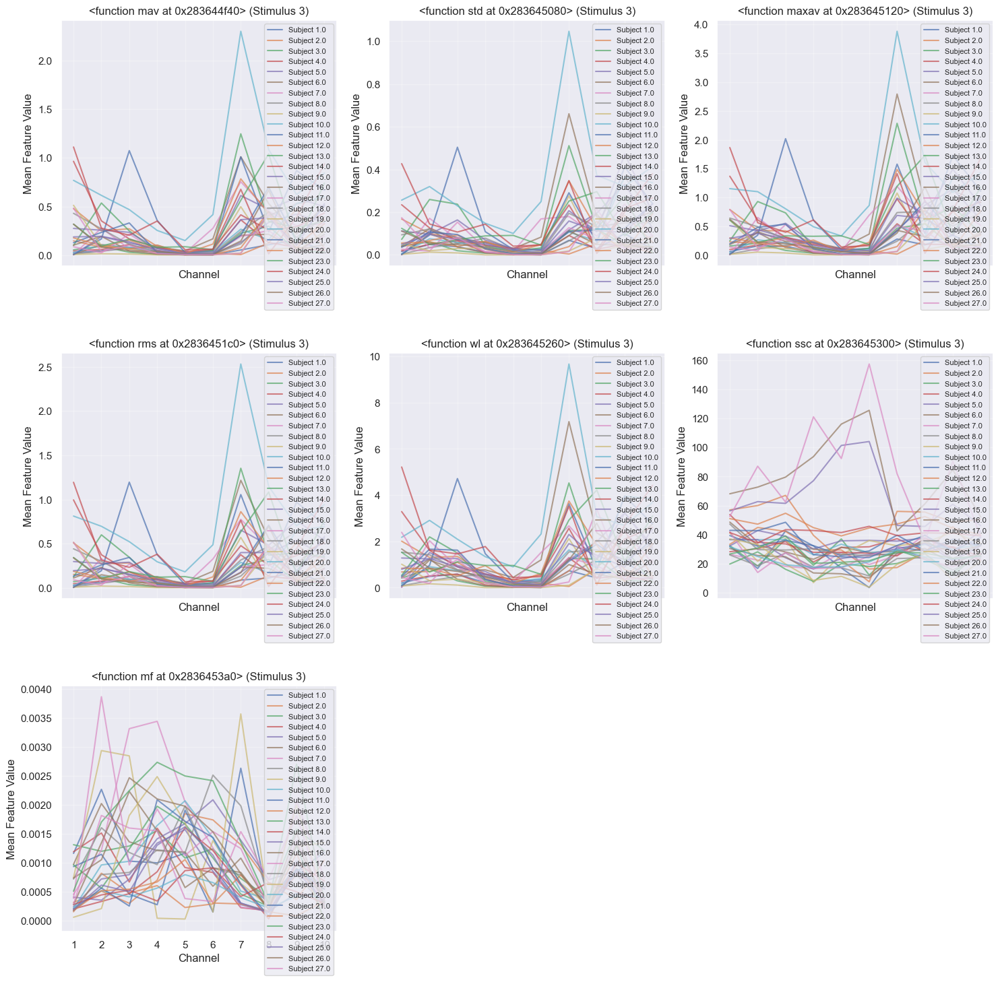

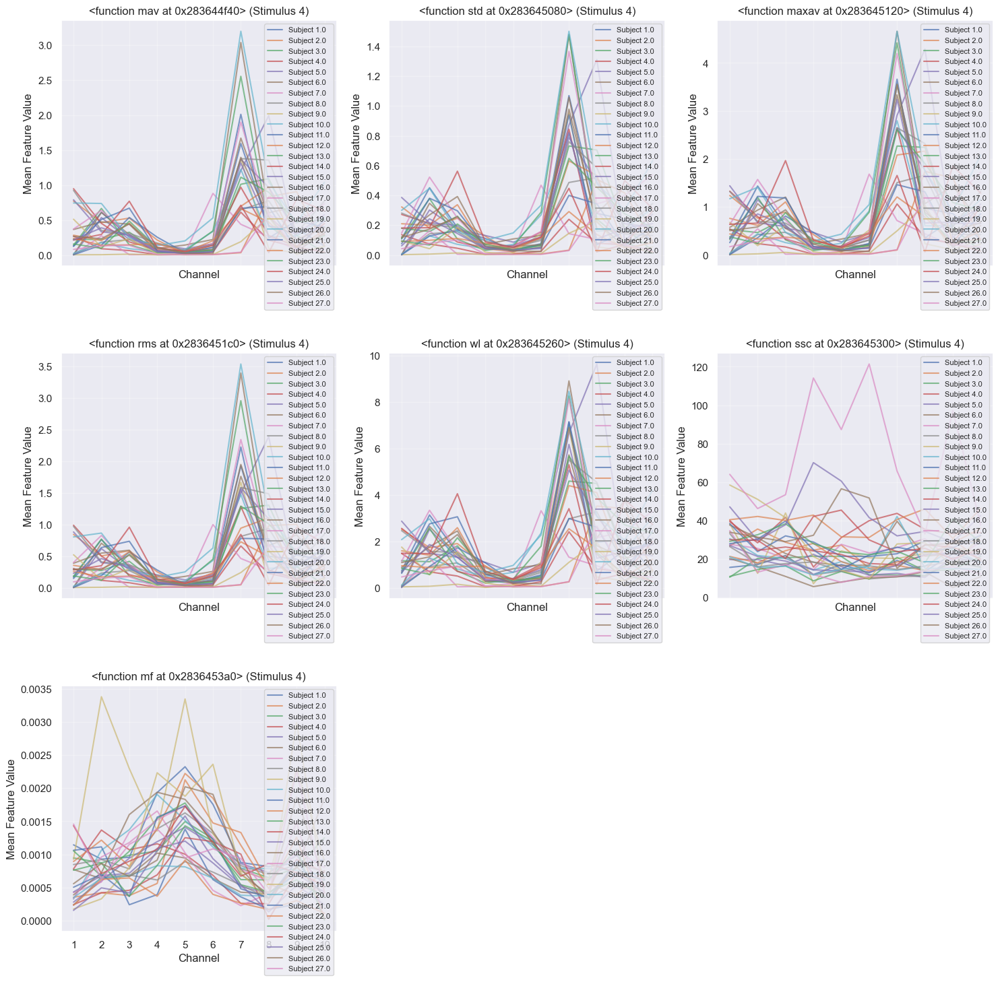

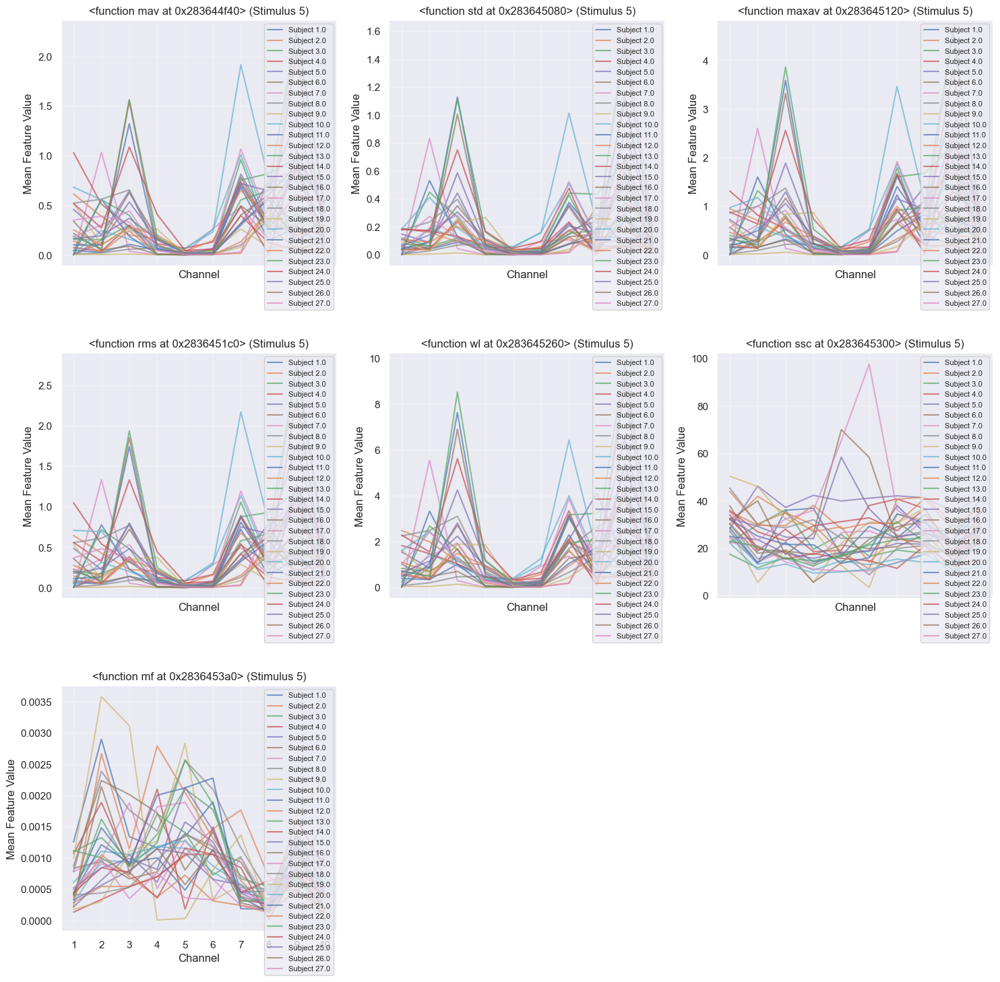

...

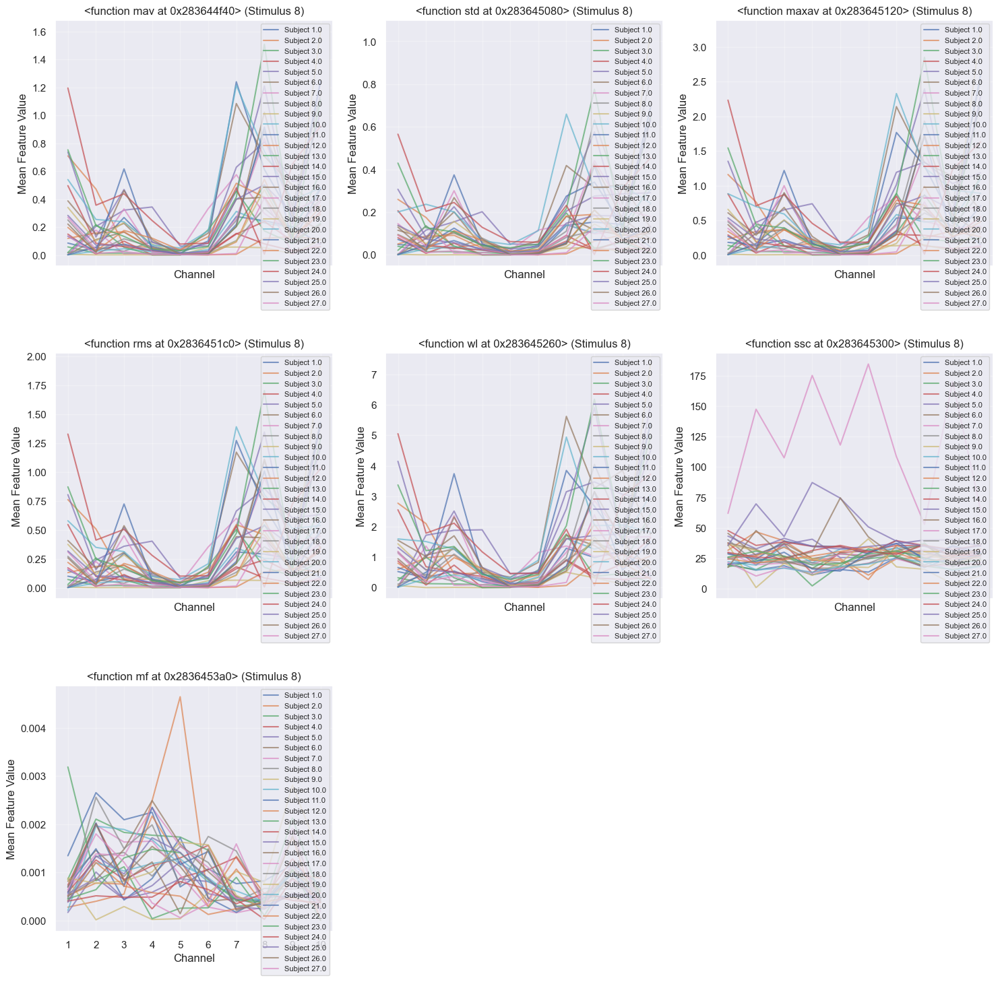

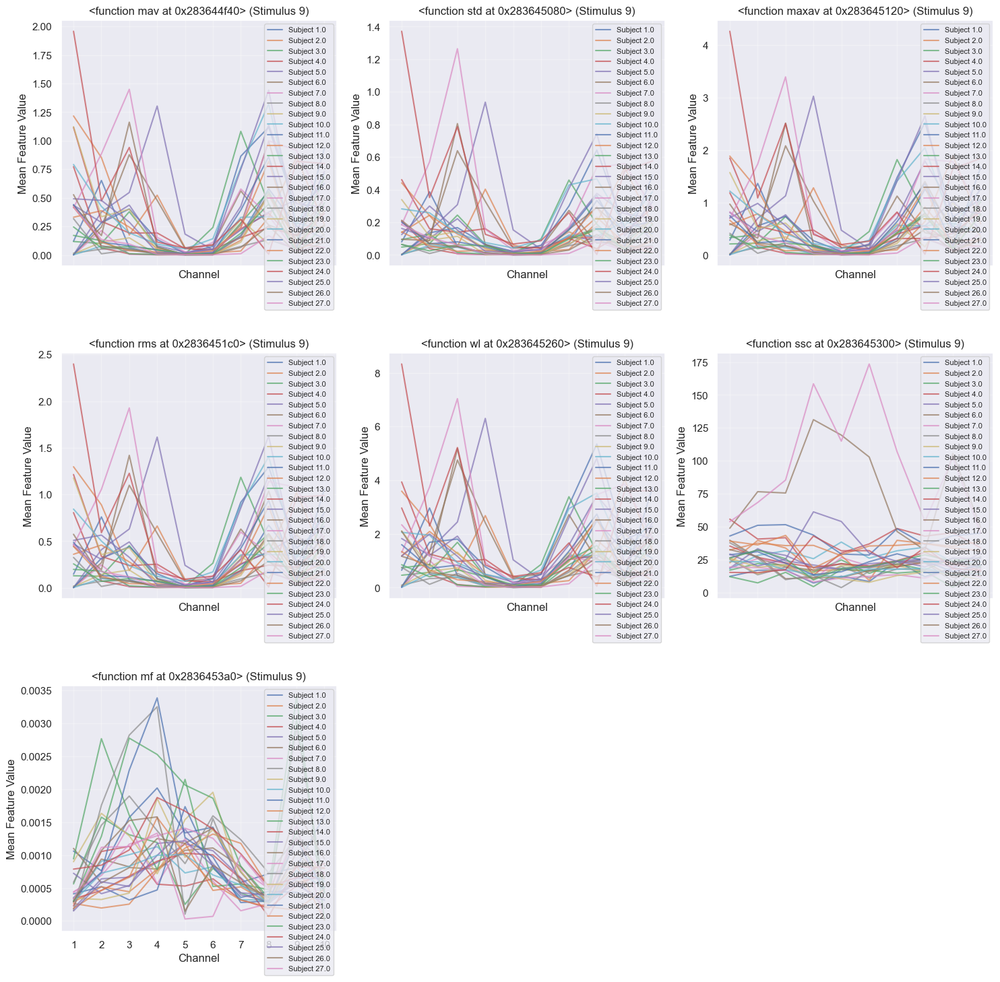

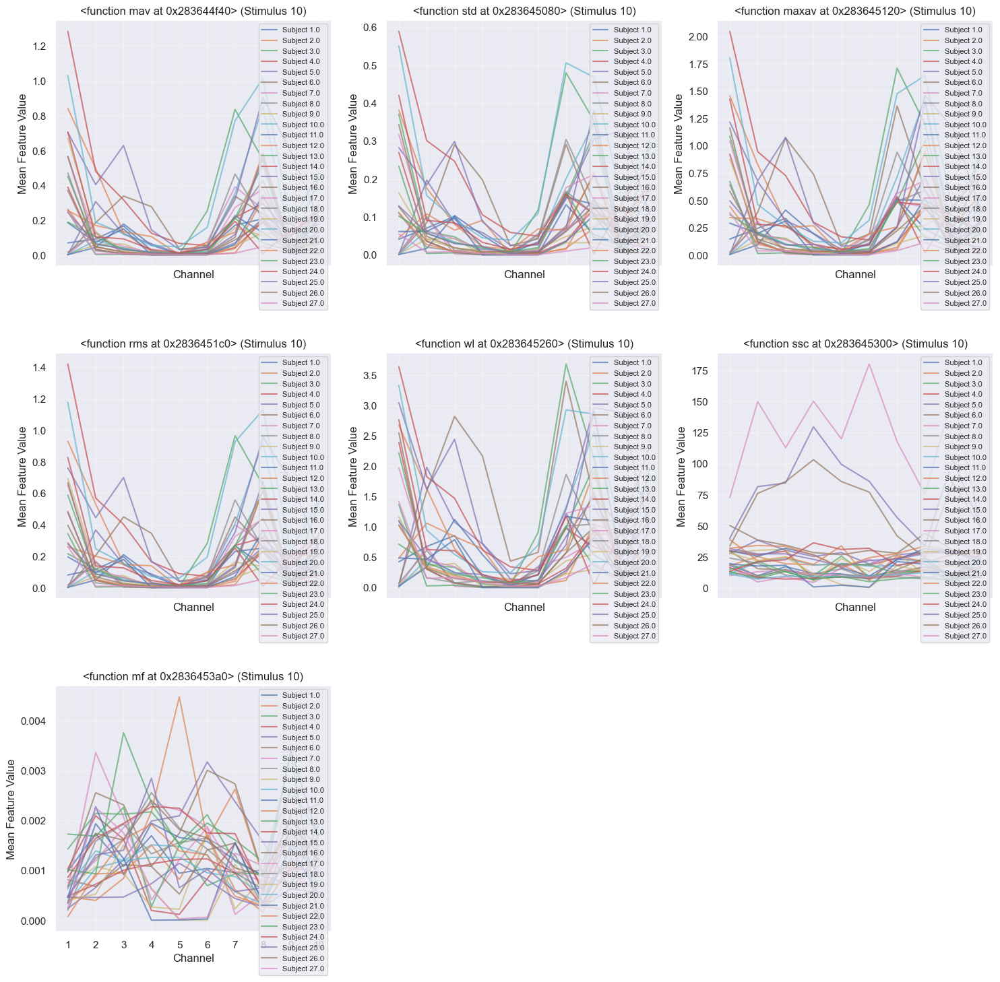

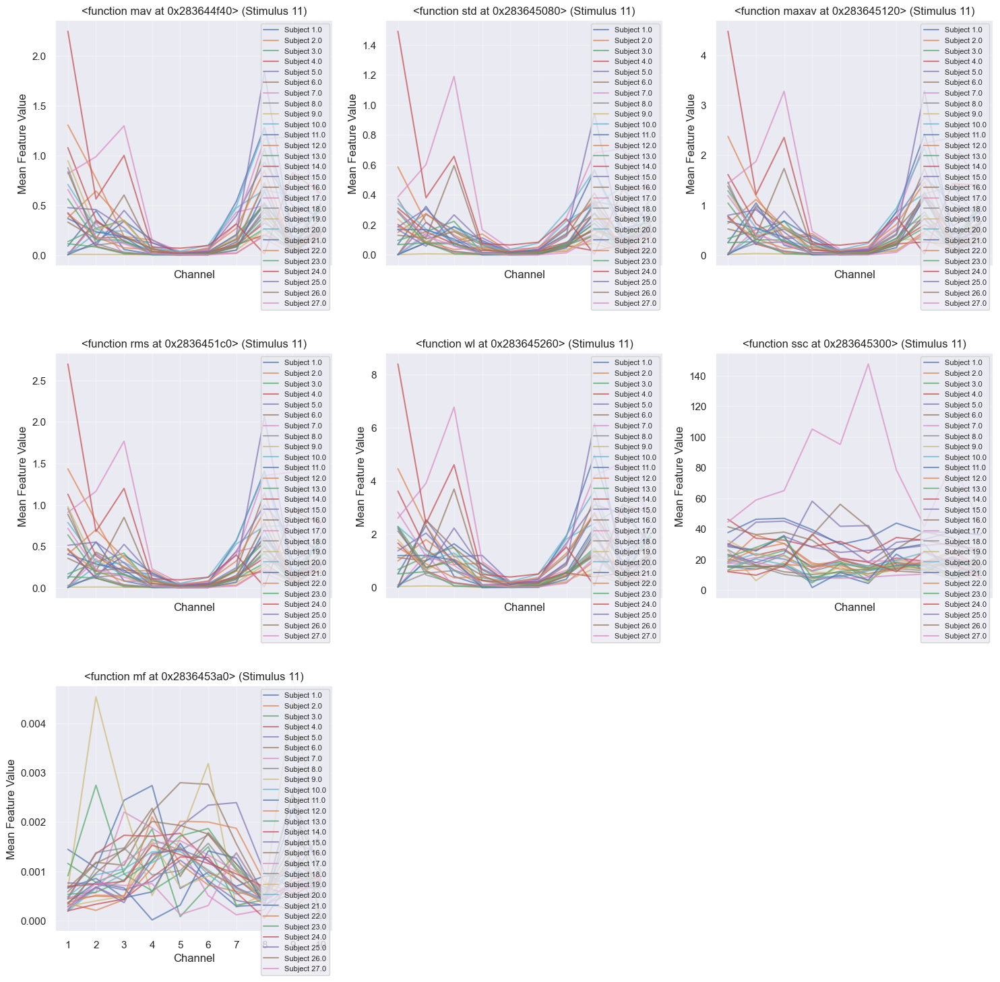

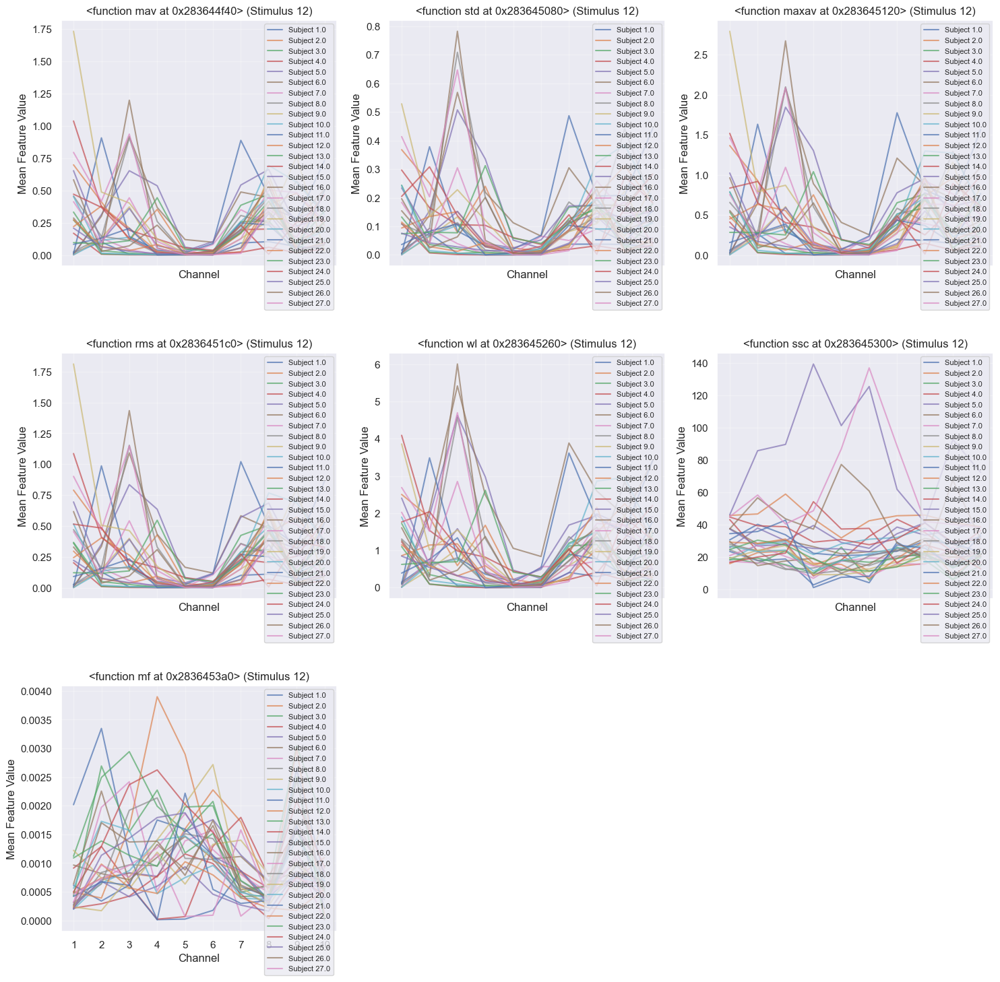

In [4]:
plot_feature_subjects(combined, n_stimuli=12, n_channels=10, feature_names=feature_functions)

### Question 3
classification model on 26 subjects

We choose as the training set to be the 26 subjects that we did not see in Part 1, and train a Random Forest Classifier on this data. Then, we test it on subject 2. We see that the accuracy drops from 94% in Part 1 to 14.66% in Part 2, and the F1 score from .. to 0.10.  

In [5]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
train_set = combined.copy()
test_set = combined.copy()
train_set = train_set[train_set['ID'] != 2]
test_set = test_set[test_set['ID'] == 2]

X_train = np.array(train_set.iloc[:, 2:])
y_train = np.array(train_set.iloc[:, 1])
X_test = np.array(test_set.iloc[:, 2:])
y_test = np.array(test_set.iloc[:, 1])

scaler = StandardScaler()
X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
X_test_z = scaler.transform(X_test) 

Accuracy: 22.50%, F1-score: 0.15


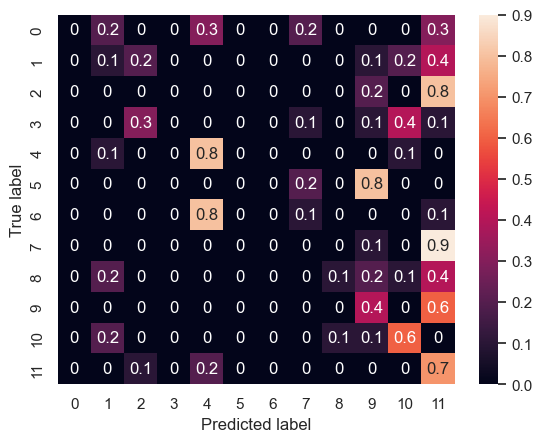

In [11]:
# best model from Part 1
n_estimators = 70
max_depth  = 10
min_samples_split = 3
min_samples_leaf = 1

clf = RandomForestClassifier(random_state=42, 
                             n_estimators = 70,
                             max_depth  = 10,
                             min_samples_split = 3,
                             min_samples_leaf = 1,
                             class_weight='balanced')

clf.fit(X_train_z, y_train)
y_pred = clf.predict(X_test_z)
accuracy = accuracy_score(y_test, y_pred)
F1 = f1_score(y_test, y_pred, average='weighted')

print(f'Accuracy: {accuracy*100:.2f}%, F1-score: {F1:.2f}')

confmat = confusion_matrix(y_test, y_pred, normalize="true")

fig, ax = plt.subplots()
sns.heatmap(confmat, annot=True, ax=ax)
ax.set_ylabel("True label")
ax.set_xlabel("Predicted label")
plt.show()

### Question 4
Cross-validation

In [7]:
# Cross validation using 1 subject as test set, the other 26 subjects as validation set
test_accuracies = []
test_F1 = []
for subj in range(1,28):
    train_set = combined.copy()
    test_set = combined.copy()
    train_set = train_set[train_set['ID'] != subj]
    test_set = test_set[test_set['ID'] == subj]

    X_train = np.array(train_set.iloc[:, 2:])
    y_train = np.array(train_set.iloc[:, 1])
    X_test = np.array(test_set.iloc[:, 2:])
    y_test = np.array(test_set.iloc[:, 1])

    scaler = StandardScaler()
    X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
    X_test_z = scaler.transform(X_test) 

    clf = RandomForestClassifier(random_state=42, 
                                n_estimators = 70,
                                max_depth  = 10,
                                min_samples_split = 3,
                                min_samples_leaf = 1,
                                class_weight='balanced')

    clf.fit(X_train_z, y_train)
    y_pred = clf.predict(X_test_z)
    accuracy = accuracy_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred, average='weighted')

    test_accuracies.append(accuracy)
    test_F1.append(F1)
    # print(f'''Fold {subj}
    # Accuracy: {accuracy*100:.2f}%
    # F1-score: {F1:.2f}\n''')

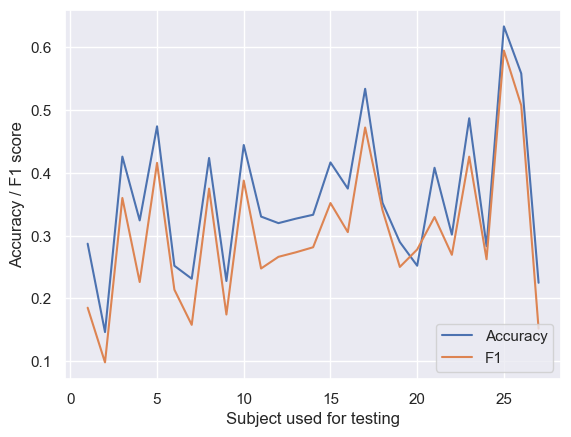

In [9]:
plt.plot(np.arange(1, 28), test_accuracies, label = 'Accuracy')
plt.plot(np.arange(1, 28), test_F1, label = 'F1')
plt.xlabel('Subject used for testing')
plt.ylabel('Accuracy / F1 score')
plt.legend(loc='lower right')
plt.show()

### Question 5
Increase the training set by subject at a time

In [10]:
subject_test = 27
test_accuracies = []
test_F1 = []

for subj in range(2,28):
    train_set = combined.copy()
    subject_train = np.arange(1, subj)
    train_set = train_set[train_set['ID'].isin(subject_train)]
    test_set = test_set[test_set['ID'] == subject_test]

    X_train = np.array(train_set.iloc[:, 2:])
    y_train = np.array(train_set.iloc[:, 1])
    X_test = np.array(test_set.iloc[:, 2:])
    y_test = np.array(test_set.iloc[:, 1])

    scaler = StandardScaler()
    X_train_z = scaler.fit_transform(X_train)  # Fit the scaler on the training data and transform it
    X_test_z = scaler.transform(X_test) 

    clf = RandomForestClassifier(random_state=42, 
                                n_estimators = 70,
                                max_depth  = 10,
                                min_samples_split = 3,
                                min_samples_leaf = 1,
                                class_weight='balanced')

    clf.fit(X_train_z, y_train)
    y_pred = clf.predict(X_test_z)
    accuracy = accuracy_score(y_test, y_pred)
    F1 = f1_score(y_test, y_pred, average='weighted')

    test_accuracies.append(accuracy)
    test_F1.append(F1)
    # print(f'''Fold {subj}
    # Accuracy: {accuracy*100:.2f}%
    # F1-score: {F1:.2f}\n''')

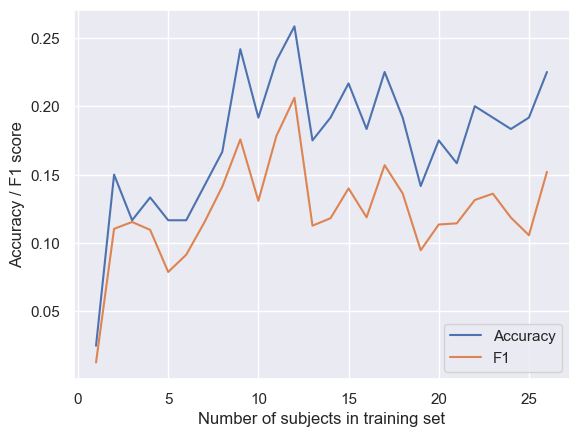

In [ ]:
plt.plot(np.arange(1, 27), test_accuracies, label = 'Accuracy')
plt.plot(np.arange(1, 27), test_F1, label = 'F1')
plt.xlabel('Number of subjects in training set')
plt.ylabel('Accuracy / F1 score')
plt.legend(loc='lower right')
plt.show()